In [1]:
import torch

# Get the PyTorch version
torch_version = torch.__version__

# Check if CUDA is available and get its version
cuda_version = torch.version.cuda if torch.cuda.is_available() else "CUDA not available"

torch_version, cuda_version

('2.3.1', '11.8')

In [2]:
# conda install -c dglteam/label/th21_cu118 dgl
#pip install urbangrammar_graphics

In [2]:
###### Import necessary libraries
import dgl
import torch
from collections import defaultdict
from tqdm import tqdm  # For progress bar



## Graph Random Walking

In [3]:
hetero_graph = dgl.load_graphs('data/London_10_landmarks/graphs/0123_10_landmarks_6_edges_graph.dgl')[0][0]

In [4]:
hetero_graph

Graph(num_nodes={'hyperedge': 206, 'landmark': 10, 'svi_location': 35462},
      num_edges={('hyperedge', 'connects', 'landmark'): 466, ('landmark', 'proximity', 'svi_location'): 1347, ('landmark', 'see_from_location', 'landmark'): 24, ('landmark', 'seen_together', 'hyperedge'): 466, ('svi_location', 'SVI_connectivity', 'svi_location'): 107757, ('svi_location', 'visibility', 'landmark'): 1619},
      metagraph=[('hyperedge', 'landmark', 'connects'), ('landmark', 'svi_location', 'proximity'), ('landmark', 'landmark', 'see_from_location'), ('landmark', 'hyperedge', 'seen_together'), ('svi_location', 'svi_location', 'SVI_connectivity'), ('svi_location', 'landmark', 'visibility')])

In [80]:
import random
from collections import Counter
from tqdm import tqdm
import torch
import matplotlib.pyplot as plt
from pyproj import Transformer

# ---------------------------
# 1. 辅助函数：获取节点的邻居及可见关系
# ---------------------------
def get_svi_for_landmark(hetero_graph, landmark_id):
    src, dst = hetero_graph.in_edges(landmark_id, etype="visibility")
    return src.cpu().tolist()

def get_svi_neighbors(hetero_graph, svi_id):
    out_neighbors = hetero_graph.successors(svi_id, etype="SVI_connectivity").cpu().tolist()
    in_neighbors = hetero_graph.predecessors(svi_id, etype="SVI_connectivity").cpu().tolist()
    return list(set(out_neighbors + in_neighbors))

def get_landmarks_from_svi(hetero_graph, svi_id):
    landmarks = hetero_graph.successors(svi_id, etype="visibility").cpu().tolist()
    return landmarks

# ---------------------------
# 2. 随机游走采样及路径记录（引入角度惩罚）
# ---------------------------
def random_walk_meta_path_record(hetero_graph, start_landmark, num_walks=100, connectivity_steps=3):
    """
    对于起始 landmark 节点，沿如下元路径进行随机游走：
      landmark (起点) → (反向 visibility 边) → SVI_A →
      (在 SVI_connectivity 子图上随机游走 connectivity_steps 步) → SVI_B →
      (通过 visibility 边) → landmark (终点)
    在 SVI_connectivity 随机游走时引入角度惩罚：若候选边与前进方向夹角大于 90°（余弦<0），则赋予较低权重。
    
    说明：
      - paths_record：仅记录原始检索获得的路径，即每次随机游走随机选择一个有效目的 landmark。
      - path_record_detail：记录包含复制的所有有效目的 landmark 对应的路径。
    
    返回：
      - result_counter: 统计每个目的 landmark 在 paths_record 中出现的次数（原始计数）
      - paths_record: 列表，每条路径为 [(node_type, node_id), ...]，每次随机游走只记录一个随机目的 landmark。
      - path_record_detail: 列表，每条路径为 [(node_type, node_id), ...]，包含所有有效目的 landmark 的复制记录。
    """
    result_counter = Counter()
    paths_record = []
    path_record_detail = []
    
    # 提前获取 svi 节点的经纬度坐标（假设数据为 EPSG:4326）
    svi_lat = hetero_graph.nodes["svi_location"].data["latitude"].cpu().numpy()
    svi_lon = hetero_graph.nodes["svi_location"].data["longitude"].cpu().numpy()
    svi_coords = list(zip(svi_lat, svi_lon))  # 每个元素为 (lat, lon)
    
    for _ in range(num_walks):
        path = [("landmark", start_landmark)]
        
        # 第一步：从起始 landmark 获取 svi 起点
        svi_candidates = get_svi_for_landmark(hetero_graph, start_landmark)
        if not svi_candidates:
            continue
        current_svi = random.choice(svi_candidates)
        path.append(("svi_location", current_svi))
        
        # 第二步：在 SVI_connectivity 子图上随机游走 connectivity_steps 步，加入角度惩罚
        for _ in range(connectivity_steps):
            neighbors = get_svi_neighbors(hetero_graph, current_svi)
            if not neighbors:
                break
            # 如果已有前一步 svi，则计算前进方向
            if len(path) >= 2 and path[-2][0] == "svi_location":
                prev_svi = path[-2][1]
                curr_coord = svi_coords[current_svi]
                prev_coord = svi_coords[prev_svi]
                v1 = (curr_coord[0] - prev_coord[0], curr_coord[1] - prev_coord[1])
                candidate_weights = []
                for cand in neighbors:
                    cand_coord = svi_coords[cand]
                    v2 = (cand_coord[0] - curr_coord[0], cand_coord[1] - curr_coord[1])
                    norm_v1 = (v1[0]**2 + v1[1]**2)**0.5
                    norm_v2 = (v2[0]**2 + v2[1]**2)**0.5
                    if norm_v1 == 0 or norm_v2 == 0:
                        cosine = 1.0
                    else:
                        cosine = (v1[0]*v2[0] + v1[1]*v2[1])/(norm_v1*norm_v2)
                    # 若余弦小于0（大于90°），则给予较低权重；否则权重为1
                    weight = 0.1 if cosine < 0 else 1.0
                    candidate_weights.append(weight)
                total_weight = sum(candidate_weights)
                if total_weight == 0:
                    break
                r = random.uniform(0, total_weight)
                cum_weight = 0
                chosen_candidate = None
                for cand, w in zip(neighbors, candidate_weights):
                    cum_weight += w
                    if r < cum_weight:
                        chosen_candidate = cand
                        break
                if chosen_candidate is None:
                    chosen_candidate = random.choice(neighbors)
                current_svi = chosen_candidate
                path.append(("svi_location", current_svi))
            else:
                current_svi = random.choice(neighbors)
                path.append(("svi_location", current_svi))
        
        # 第三步：从当前 SVI 通过 visibility 边获取 landmark 终点，排除自环
        landmarks_reached = get_landmarks_from_svi(hetero_graph, current_svi)
        if landmarks_reached:
            valid_destinations = [lm for lm in landmarks_reached if lm != start_landmark]
            if not valid_destinations:
                continue
            # 原始路径记录：随机选取一个目的 landmark
            dest_landmark_orig = random.choice(valid_destinations)
            new_path_orig = path.copy() + [("landmark", dest_landmark_orig)]
            paths_record.append(new_path_orig)
            
            # 详细路径记录：记录所有有效的目的 landmark
            for dest in valid_destinations:
                new_path_detail = path.copy() + [("landmark", dest)]
                result_counter[dest] += 1
                path_record_detail.append(new_path_detail)
    
    return result_counter, paths_record, path_record_detail

def compute_random_walk_paths(hetero_graph, num_walks=100, connectivity_steps=3):
    """
    对每个 landmark 节点执行随机游走，返回：
      - connectivity: 每个起点 landmark 对应的目的 landmark 的连接比例（基于原始记录）
      - paths_dict: 每个起点 landmark 对应的随机游走路径（仅原始路径记录，每次一条）
      - path_dict_detail: 每个起点 landmark 对应的详细随机游走路径（包含所有有效目的节点）
    """
    connectivity = dict()
    paths_dict = dict()           # 存储原始路径记录
    path_dict_detail = dict()     # 存储详细路径记录
    n_landmark = hetero_graph.num_nodes("landmark")
    
    for lm in tqdm(range(n_landmark), desc="Random walks for landmarks"):
        counts, paths, detail_paths = random_walk_meta_path_record(
            hetero_graph, start_landmark=lm,
            num_walks=num_walks, connectivity_steps=connectivity_steps
        )
        connectivity[lm] = {dest: count / num_walks for dest, count in counts.items()}
        paths_dict[lm] = paths
        path_dict_detail[lm] = detail_paths
    
    return connectivity, paths_dict, path_dict_detail


In [86]:

# 确保 hetero_graph 已正确构建，并具有节点类型 "landmark" 和 "svi_location"
# 参数设置：可根据实际图规模调整
num_walks = 2000         # 每个 landmark 执行的随机游走次数
connectivity_steps = 80  # 在 SVI_connectivity 子图上随机游走的步数

# 计算所有 landmark 之间的随机游走联系及记录路径
connectivity, paths_dict, path_dict_detail = compute_random_walk_paths(hetero_graph,
                                                            num_walks=num_walks,
                                                            connectivity_steps=connectivity_steps)

# 输出部分联系强度信息
print("基于随机游走的 landmark 联系强度：")
for src_landmark, dests in connectivity_result.items():
    print(f"landmark {src_landmark}:")
    for dest, strength in dests.items():
        print(f"  -> landmark {dest}: strength = {strength:.4f}")


Random walks for landmarks: 100%|██████████| 10/10 [02:21<00:00, 14.20s/it]

基于随机游走的 landmark 联系强度：
landmark 0:
  -> landmark 2: strength = 0.0600
  -> landmark 3: strength = 0.0030
  -> landmark 5: strength = 0.0015
  -> landmark 1: strength = 0.0010
landmark 1:
  -> landmark 5: strength = 0.0155
  -> landmark 7: strength = 0.0080
  -> landmark 9: strength = 0.0035
  -> landmark 4: strength = 0.0065
  -> landmark 6: strength = 0.0020
  -> landmark 3: strength = 0.0040
landmark 2:
  -> landmark 0: strength = 0.0565
  -> landmark 5: strength = 0.0040
  -> landmark 3: strength = 0.0005
  -> landmark 7: strength = 0.0055
  -> landmark 1: strength = 0.0015
  -> landmark 9: strength = 0.0010
landmark 3:
  -> landmark 5: strength = 0.0140
  -> landmark 1: strength = 0.0070
  -> landmark 7: strength = 0.0155
  -> landmark 0: strength = 0.0005
landmark 4:
  -> landmark 5: strength = 0.0630
  -> landmark 1: strength = 0.0185
  -> landmark 6: strength = 0.0255
  -> landmark 9: strength = 0.0190
  -> landmark 8: strength = 0.0015
  -> landmark 7: strength = 0.0020
landmar

In [91]:
import pickle

# Save the connectivity dictionary to a file
with open("data/London_10_landmarks/random_walk_results/0403_80_steps_2000_walk_connectivity.pkl", "wb") as f:
    pickle.dump(connectivity_result, f)

# Save the paths dictionary to a file
with open("data/London_10_landmarks/random_walk_results/0403_80_steps_2000_walk_paths_dict_detail.pkl", "wb") as f:
    pickle.dump(path_dict_detail, f)

# Save the paths dictionary to a file
with open("data/London_10_landmarks/random_walk_results/0403_80_steps_2000_walk_paths_dict.pkl", "wb") as f:
    pickle.dump(paths_dict, f)

print("Connectivity and paths_dict have been saved to 'connectivity.pkl' and 'paths_dict.pkl'.")

Connectivity and paths_dict have been saved to 'connectivity.pkl' and 'paths_dict.pkl'.


In [23]:
import pickle

# Read the connectivity dictionary from the pickle file
with open("data/London_10_landmarks/random_walk_results/0403_80_steps_2000_walk_connectivity.pkl", "rb") as f:
    connectivity_result = pickle.load(f)

# Read the paths dictionary from the pickle file
with open("data/London_10_landmarks/random_walk_results/0403_80_steps_2000_walk_paths_dict_detail.pkl", "rb") as f:
    path_dict_detail = pickle.load(f)

# Read the paths dictionary from the pickle file
with open("data/London_10_landmarks/random_walk_results/0403_80_steps_2000_walk_paths_dict.pkl", "rb") as f:
    paths_dict = pickle.load(f)

# Optionally, print out the loaded data to verify
print("Connectivity:", connectivity_result)
print("Paths Dict:", paths_dict)

Connectivity: {0: {2: 0.06, 3: 0.003, 5: 0.0015, 1: 0.001}, 1: {5: 0.0155, 7: 0.008, 9: 0.0035, 4: 0.0065, 6: 0.002, 3: 0.004}, 2: {0: 0.0565, 5: 0.004, 3: 0.0005, 7: 0.0055, 1: 0.0015, 9: 0.001}, 3: {5: 0.014, 1: 0.007, 7: 0.0155, 0: 0.0005}, 4: {5: 0.063, 1: 0.0185, 6: 0.0255, 9: 0.019, 8: 0.0015, 7: 0.002}, 5: {9: 0.0155, 1: 0.011, 6: 0.006, 7: 0.0255, 4: 0.0065, 8: 0.0035, 3: 0.0065, 0: 0.001, 2: 0.0025}, 6: {1: 0.0225, 5: 0.051, 4: 0.06, 9: 0.0215, 8: 0.002, 7: 0.0015}, 7: {5: 0.058, 3: 0.0275, 9: 0.0015, 0: 0.0015, 1: 0.0155, 2: 0.0025, 6: 0.0005, 4: 0.0015}, 8: {4: 0.0385, 5: 0.078, 7: 0.004, 6: 0.0135, 9: 0.024, 3: 0.002, 1: 0.0075}, 9: {1: 0.0155, 5: 0.0735, 4: 0.03, 6: 0.0105, 8: 0.0035, 7: 0.0085, 0: 0.0005, 3: 0.0005}}
Paths Dict: {0: [[('landmark', 0), ('svi_location', 28952), ('svi_location', 28259), ('svi_location', 14351), ('svi_location', 1379), ('svi_location', 2868), ('svi_location', 3611), ('svi_location', 9942), ('svi_location', 2868), ('svi_location', 3613), ('svi

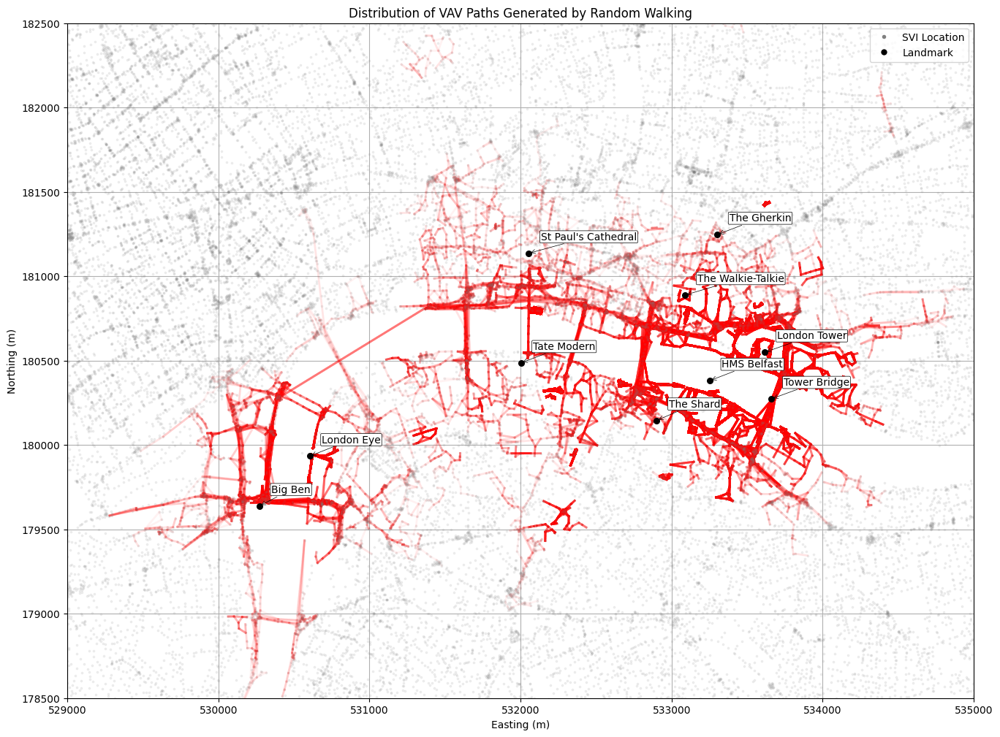

In [9]:
def visualize_paths(hetero_graph, paths_dict, connectivity_result, 
                    node_scale=50, agg_line_alpha=0.7):
    """
    改进后的可视化函数 - 方案二：基于线宽与透明度渐变的累积绘制

    主要改动：
      1. 对所有 svi-svi 路径段进行均匀采样，构建二维直方图估计路径密度。
      2. 对于每个路径段，根据起点与终点处的密度均值，
         固定使用红色，并将密度映射到线宽和透明度，
         从而使高密度区域显示更粗且更不透明的红色线条。
      3. 同时绘制 svi 与 landmark 节点，以及 landmark 之间根据连接强度绘制的聚合连线。
      4. 为每个 landmark 添加数据标签（使用预定义的数据标签）。
      
    参数：
      - hetero_graph: 构建好的异质图对象
      - paths_dict: {起始 landmark: [路径1, 路径2, ...], ...}
      - connectivity_result: {起始 landmark: {目标 landmark: 强度, ...}, ...}
      - node_scale: 节点散点图尺寸
      - agg_line_alpha: 聚合 landmark 连接线透明度
    """
    import numpy as np
    from pyproj import Transformer
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D
    import matplotlib.colors as colors
    import matplotlib.cm as cm

    # 坐标转换：将 landmark 的 EPSG:4326 坐标转换为 EPSG:27700 坐标系
    transformer = Transformer.from_crs("epsg:4326", "epsg:27700", always_xy=True)
    lm_lat = hetero_graph.nodes["landmark"].data["latitude"].cpu().numpy()
    lm_lon = hetero_graph.nodes["landmark"].data["longitude"].cpu().numpy()
    lm_x, lm_y = transformer.transform(lm_lon, lm_lat)
    
    # svi_location 坐标（假设不转换，或已在目标坐标系）
    svi_lat = hetero_graph.nodes["svi_location"].data["latitude"].cpu().numpy()
    svi_lon = hetero_graph.nodes["svi_location"].data["longitude"].cpu().numpy()
    svi_x, svi_y = svi_lon, svi_lat

    # 采样所有 svi-svi 路径段上的点，构建采样点列表
    all_points_x = []
    all_points_y = []
    num_samples = 100  # 每个路径段采样点数
    
    for start_lm, paths in paths_dict.items():
        for path in paths:
            for i in range(len(path) - 1):
                node1, node2 = path[i], path[i+1]
                if node1[0] == "svi_location" and node2[0] == "svi_location":
                    # 跳过连续重复节点
                    if node1[1] == node2[1]:
                        continue
                    x1, y1 = svi_x[node1[1]], svi_y[node1[1]]
                    x2, y2 = svi_x[node2[1]], svi_y[node2[1]]
                    xs = np.linspace(x1, x2, num_samples)
                    ys = np.linspace(y1, y2, num_samples)
                    all_points_x.extend(xs)
                    all_points_y.extend(ys)
    
    # 构建二维直方图作为路径密度
    if len(all_points_x) > 0:
        all_points_x = np.array(all_points_x)
        all_points_y = np.array(all_points_y)
        # 以 svi 节点范围作为直方图范围
        x_min, x_max = np.min(svi_x), np.max(svi_x)
        y_min, y_max = np.min(svi_y), np.max(svi_y)
        bins = 300  # 可根据需要调整分辨率
        H, xedges, yedges = np.histogram2d(all_points_x, all_points_y, bins=bins,
                                            range=[[x_min, x_max], [y_min, y_max]])
    else:
        H = None

    # 定义一个辅助函数，根据 (x, y) 坐标在直方图中插值获取密度值（使用最近邻查找）
    def interpolate_density(x, y, H, xedges, yedges):
        i = np.searchsorted(xedges, x) - 1
        j = np.searchsorted(yedges, y) - 1
        if i < 0 or i >= H.shape[0] or j < 0 or j >= H.shape[1]:
            return 0
        return H[i, j]
    
    plt.figure(figsize=(16, 12)) 
    
    # 设置线宽映射参数（低密度对应较细线条，高密度对应较粗线条）
    min_linewidth = 2
    max_linewidth = 8.0

    # 设置透明度映射参数（低密度对应较高透明度，即alpha较低；高密度对应较低透明度，即alpha较高）
    min_alpha = 0.05
    max_alpha = 0.6

    # 对每个 svi-svi 路径段，根据局部密度调整线宽和透明度后绘制（颜色固定为红色）
    for start_lm, paths in paths_dict.items():
        for path in paths:
            for i in range(len(path) - 1):
                node1, node2 = path[i], path[i+1]
                if node1[0] == "svi_location" and node2[0] == "svi_location":
                    if node1[1] == node2[1]:
                        continue
                    x1, y1 = svi_x[node1[1]], svi_y[node1[1]]
                    x2, y2 = svi_x[node2[1]], svi_y[node2[1]]
                    # 获取路径段起点与终点的密度值
                    if H is not None:
                        density1 = interpolate_density(x1, y1, H, xedges, yedges)
                        density2 = interpolate_density(x2, y2, H, xedges, yedges)
                        density_avg = (density1 + density2) / 2
                    else:
                        density_avg = 1
                    # 固定颜色为红色
                    color_val = 'red'
                    # 根据密度映射线宽（简单线性映射）
                    if H is not None and np.max(H) > 1:
                        linewidth = min_linewidth + (density_avg - 1) / (np.max(H) - 1) * (max_linewidth - min_linewidth)
                        linewidth = np.clip(linewidth, min_linewidth, max_linewidth)
                    else:
                        linewidth = min_linewidth
                    # 根据密度映射透明度（alpha值）：密度越高，alpha越大（不透明）
                    if H is not None and np.max(H) > 1:
                        alpha_val = min_alpha + (density_avg - 1) / (np.max(H) - 1) * (max_alpha - min_alpha)
                        alpha_val = np.clip(alpha_val, min_alpha, max_alpha)
                    else:
                        alpha_val = max_alpha
                    plt.plot([x1, x2], [y1, y2], color=color_val, linewidth=linewidth, alpha=alpha_val)
    
    # 绘制 svi 与 landmark 节点
    plt.scatter(svi_x, svi_y, c='gray', s=node_scale*0.1, label='SVI Location', 
                alpha=0.1, zorder=2)
    plt.scatter(lm_x, lm_y, c='black', s=node_scale, label='Landmark', zorder=3)
    
    # 添加 landmark 数据标签（使用预定义的名称）
    landmark_labels = ["Big Ben", "The Gherkin", "London Eye",'St Paul\'s Cathedral','Tower Bridge', 'The Shard',
                       'London Tower','Tate Modern','HMS Belfast', 'The Walkie-Talkie']
    for idx, (x, y) in enumerate(zip(lm_x, lm_y)):
        label = landmark_labels[idx] if idx < len(landmark_labels) else str(idx)
        # 设定标签偏移（缩短连线长度）
        offset_x, offset_y = 80, 80  # 减小偏移量，缩短连线长度
        plt.annotate(label,
                     xy=(x, y),
                     xytext=(x + offset_x, y + offset_y),
                     textcoords='data',
                     bbox=dict(boxstyle="round,pad=0.1", fc="white", ec="black", lw=0.5),
                     arrowprops=dict(arrowstyle="->", color="black", lw=0.5),
                     fontsize=10,
                     zorder=6)
    
    # 裁切显示范围：x轴 [178500, 182500]，y轴 [529000, 535000]
    plt.ylim(178500, 182500)
    plt.xlim(529000, 535000)

    # 添加自定义图例
    node_legend = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=5, label='SVI Location'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=7, label='Landmark')
    ]
    plt.legend(handles=node_legend, loc='upper right')
    
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.title("Distribution of VAV Paths Generated by Random Walking")
    plt.grid(True)
    plt.show()

# 示例调用（请确保 hetero_graph, paths_dict, connectivity_result 已正确定义）
visualize_paths(hetero_graph, paths_dict, connectivity_result,
                node_scale=30, agg_line_alpha=0.4)


In [16]:
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
from random import shuffle
import contextily

In [53]:
def visualize_center_landmark(hetero_graph, center, connectivity_result, paths_dict, 
                              node_scale=50, svi_linewidth=3, agg_line_alpha=0.7):
    """
    为给定中心 landmark 绘制图：
      - 使用红色连线显示 center 与其他 landmark 之间的 aggregated connectivity（线宽与联系强度相关，并标注强度）。
      - 绘制从 center 出发的随机游走路径中，仅绘制相邻两个 svi 节点之间的连线，
        使用不同颜色区分 center 与各目标 landmark（彩色粗线显示）。
      - 对于两类连线，均只绘制 aggregated connectivity 大于 0.002 的 link。
      - 图例中显示 landmark 对与颜色的对应关系。
      
    注意：landmark 名称采用预定义列表进行映射。只有与 center 存在连线的 landmark 才会显示数据标签，
          且数据标签带有白底黑框（无箭头），标签中包含该 landmark 的名称及其与 center 的连接强度（格式化为 3 位小数）。
          未连接的 landmark 节点不予可视化。
    """
    from pyproj import Transformer
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D
    # Import the new styling package (assumed to be installed)
    import urbangrammar_graphics as ug

    # 预定义 landmark 名称（顺序需与 hetero_graph 中 landmark 的顺序一致）
    landmark_names = ["big_ben", "gherkin", "london_eye", "st_paul", "tower_bridge", 
                      "the_shard", "london_tower", "tate_modern", "belfast", "walkie_talkie"]
    landmark_names = ["Big Ben", "The Gherkin", "London Eye", "St Paul's Cathedral", "Tower Bridge", 
                      "The Shard", "London Tower", "Tate Modern", "HMS Belfast", "The Walkie-Talkie"]
    transformer = Transformer.from_crs("epsg:4326", "epsg:27700", always_xy=True)
    
    # 获取并转换 landmark 坐标
    lm_lat = hetero_graph.nodes["landmark"].data["latitude"].cpu().numpy()
    lm_lon = hetero_graph.nodes["landmark"].data["longitude"].cpu().numpy()
    lm_x, lm_y = transformer.transform(lm_lon, lm_lat)
    
    # 获取并转换 svi_location 坐标
    svi_lat = hetero_graph.nodes["svi_location"].data["latitude"].cpu().numpy()
    svi_lon = hetero_graph.nodes["svi_location"].data["longitude"].cpu().numpy()
    svi_x, svi_y = svi_lon, svi_lat
    
    plt.figure(figsize=(12, 9))
    
    # 根据 connectivity_result，仅保留与 center 相关的 landmark 节点
    connected_nodes = set()
    if center in connectivity_result:
        for target, strength in connectivity_result[center].items():
            if strength >= 0.002:
                connected_nodes.add(target)
    connected_nodes.add(center)
    
    # Filter landmark nodes to only display those with a data label.
    import numpy as np
    connected_indices = sorted(list(connected_nodes))
    plt.scatter(lm_x[connected_indices], lm_y[connected_indices], c='black', 
                s=node_scale*1.5, label='Landmark', zorder=3)
    
    # 绘制所有 SVI 节点（不筛选）
    plt.scatter(svi_x, svi_y, c='gray', s=node_scale*0.1, label='SVI Location', 
                alpha=0.05, zorder=0)
    
    # Annotate only the connected landmark nodes with a data label that includes connectivity strength.
    offset_x, offset_y = -150, 150
    for idx in connected_indices:
        x = lm_x[idx]
        y = lm_y[idx]
        # For the center node, we only show the name.
        if idx == center:
            label = landmark_names[idx] if idx < len(landmark_names) else f"L{idx}"
        else:
            # Retrieve the connectivity strength from center to this landmark.
            strength = connectivity_result[center].get(idx, None)
            if strength is not None:
                label = f"{landmark_names[idx]} ({strength:.3f})"
            else:
                label = landmark_names[idx] if idx < len(landmark_names) else f"L{idx}"
        plt.annotate(label,
                     xy=(x, y),
                     xytext=(x + offset_x, y + offset_y),
                     textcoords='data',
                     bbox=dict(facecolor='white', edgecolor='black',alpha = 0.8, boxstyle='round,pad=0.3'),
                     fontsize=9,
                     color='black',
                     zorder=6)
    
    # 绘制 center 与其他 landmark 之间的聚合连线（仅绘制 aggregated connectivity ≥ 0.002 的连线）
    linewidth_scale = 5
    if center in connectivity_result:
        for target, strength in connectivity_result[center].items():
            if strength < 0.002:
                continue
            x_vals = [lm_x[center], lm_x[target]]
            y_vals = [lm_y[center], lm_y[target]]
            lw = 1 + strength * linewidth_scale
            plt.plot(x_vals, y_vals, color='black', alpha=agg_line_alpha, linewidth=lw)
            mid_x = (lm_x[center] + lm_x[target]) / 2
            mid_y = (lm_y[center] + lm_y[target]) / 2
            #plt.text(mid_x, mid_y, f"{strength:.3f}", color='black', fontsize=8, ha='right', va='bottom')
    
    # Use the new package to obtain a colormap.
    # Here we use the number of landmark names as n_clusters.
    n_clusters = len(landmark_names)
    #cmap = ug.get_colormap(n_clusters)
    cmap = plt.cm.get_cmap("tab10")
    pair_colors = {}
    legend_elements = []
    color_index = 0
    
    # 绘制从 center 出发的随机游走路径（仅考虑起始为 center 且终点为 landmark 的路径）
    if center in paths_dict:
        for path in paths_dict[center]:
            # 检查路径起始与终止是否为 landmark，并获取目标
            if path[0][0] == "landmark" and path[0][1] == center and path[-1][0] == "landmark":
                target = path[-1][1]
            else:
                continue
            if target == center:
                continue
            if connectivity_result.get(center, {}).get(target, 0) < 0.002:
                continue
            pair_key = target
            if pair_key not in pair_colors:
                # Normalize color_index by (n_clusters - 1)
                pair_colors[pair_key] = cmap(color_index/(n_clusters - 1)) if n_clusters > 1 else cmap(0)
                label = (f"{landmark_names[center]} - {landmark_names[target]}" 
                         if center < len(landmark_names) and target < len(landmark_names) 
                         else f"L{center} - L{target}")
                legend_elements.append(Line2D([0], [0], color=pair_colors[pair_key],
                                              lw=svi_linewidth, label=label))
                color_index += 1
            color = pair_colors[pair_key]
            for i in range(len(path) - 1):
                node1, node2 = path[i], path[i+1]
                if node1[0] == "svi_location" and node2[0] == "svi_location":
                    if node1[1] == node2[1]:
                        continue
                    x1, y1 = svi_x[node1[1]], svi_y[node1[1]]
                    x2, y2 = svi_x[node2[1]], svi_y[node2[1]]
                    plt.plot([x1, x2], [y1, y2], color=color, alpha=0.5, linewidth=svi_linewidth)
    
    node_legend = [Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=10, label='Landmark'),
                   Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=5, label='SVI Location')]
    all_legend = node_legend + legend_elements
    plt.legend(handles=all_legend, loc='upper left')
    
    plt.ylim(178500, 182500)
    plt.xlim(529000, 535000)
    
    title_label = landmark_names[center] if center < len(landmark_names) else f"L{center}"
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.title(f"{title_label} Centered Connectivity & SVI Paths (EPSG:27700)")
    plt.grid(True)
    plt.show()


/tmp/ipykernel_2067195/270878236.py:100: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("tab10")


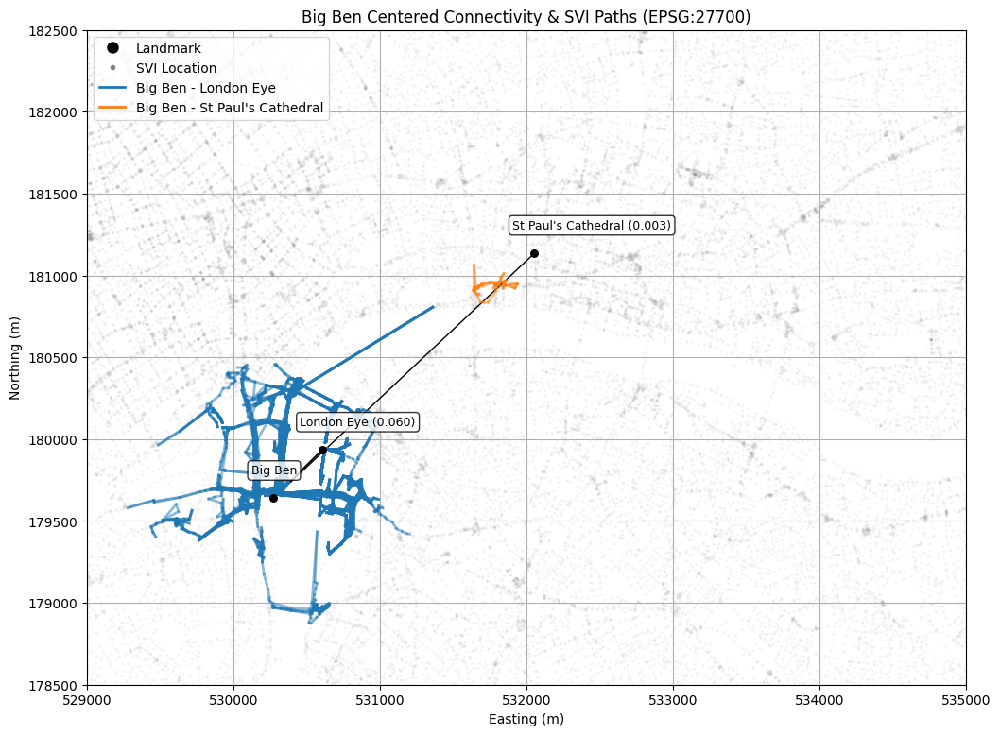

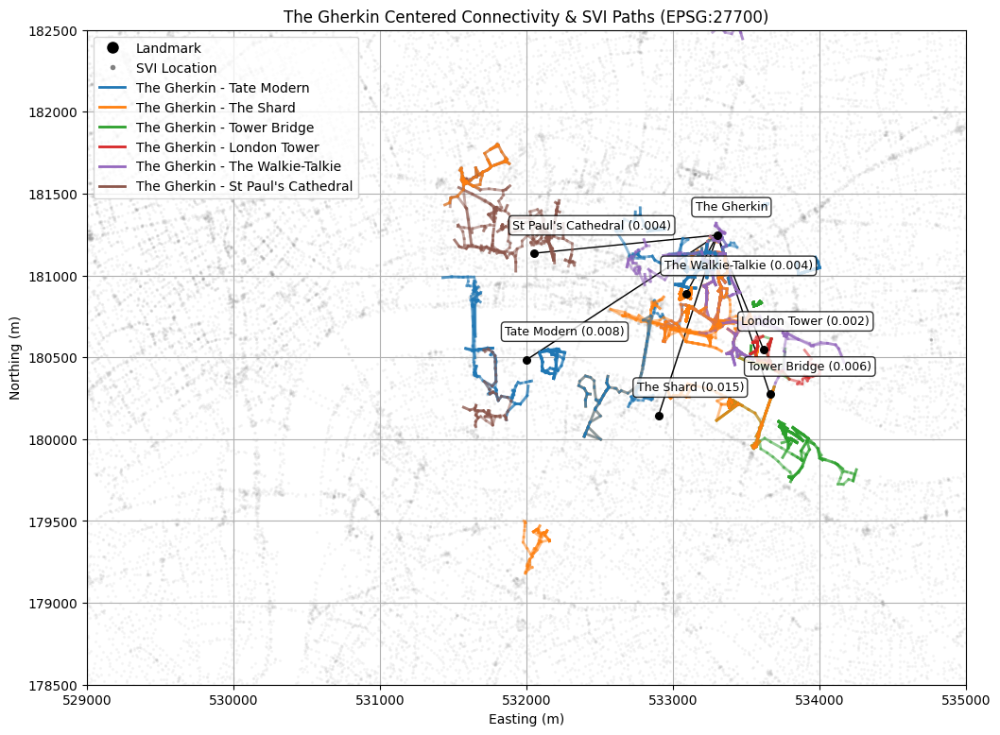

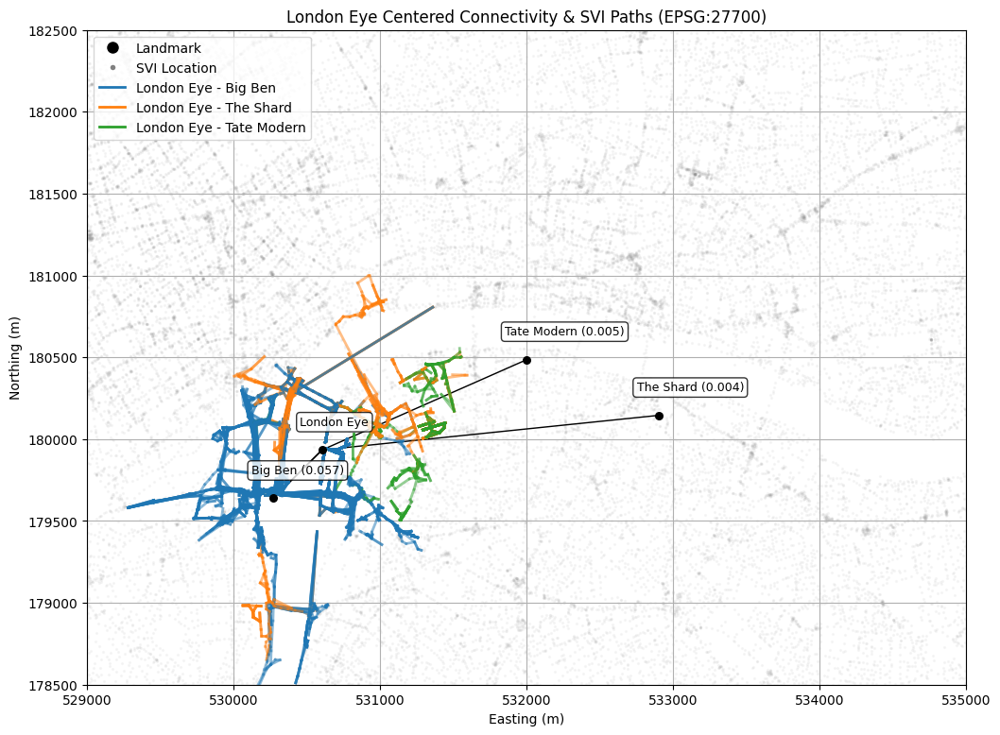

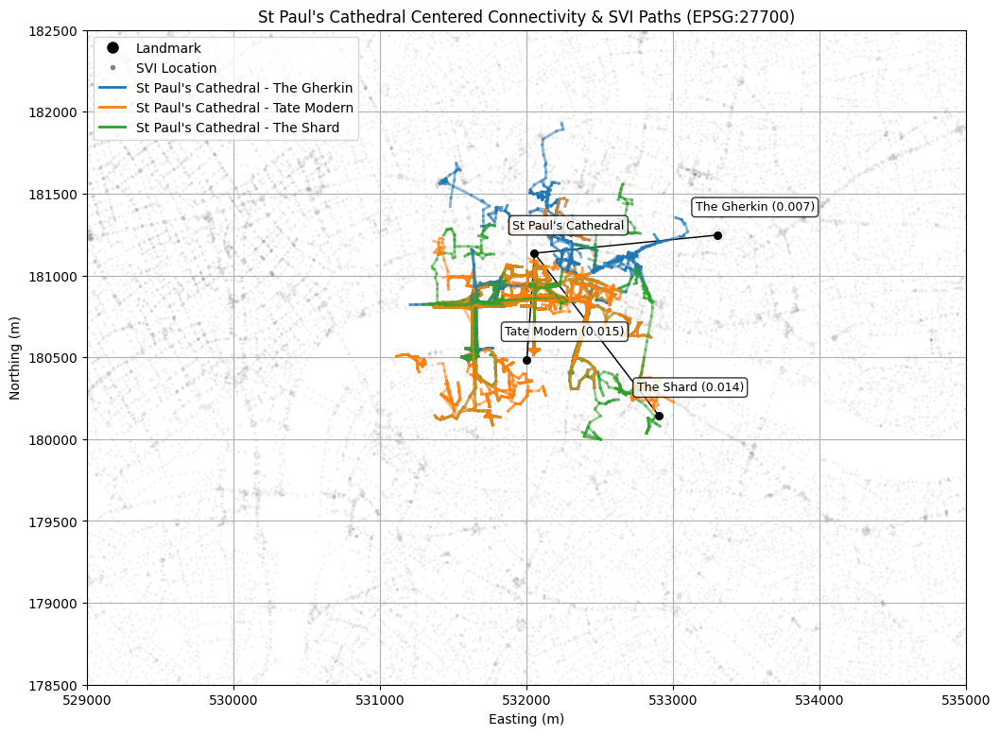

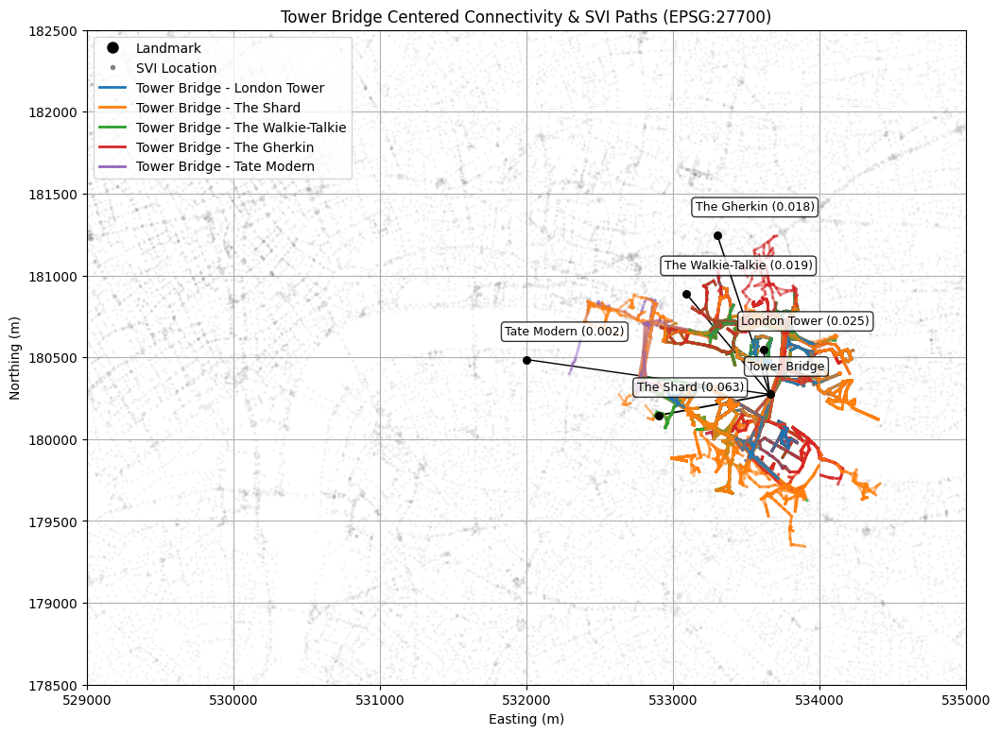

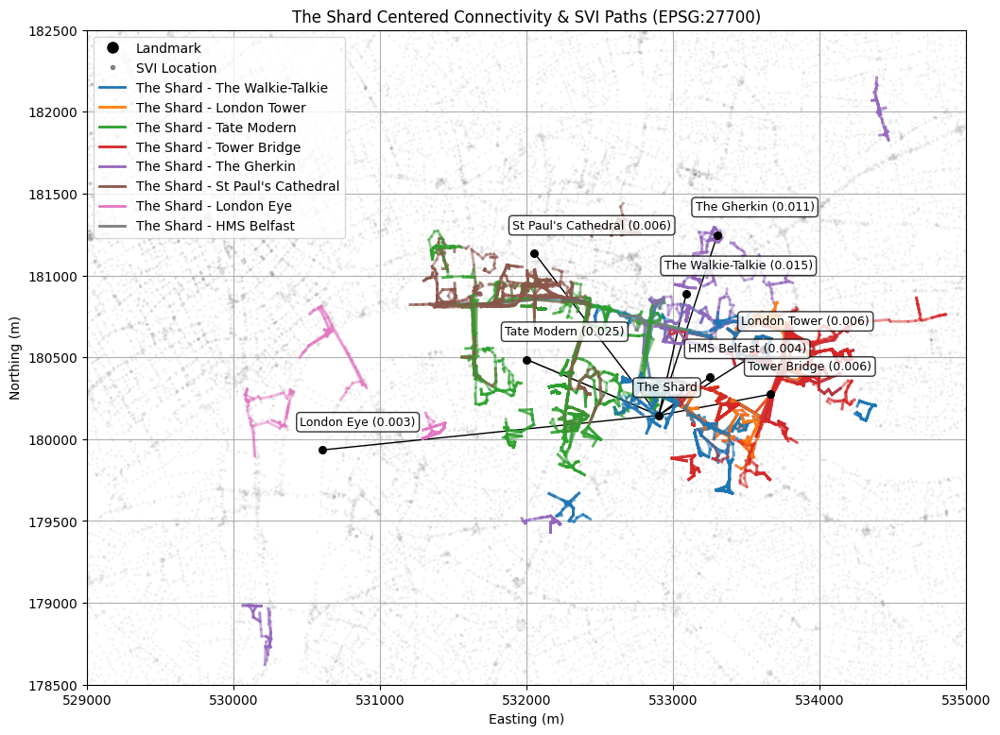

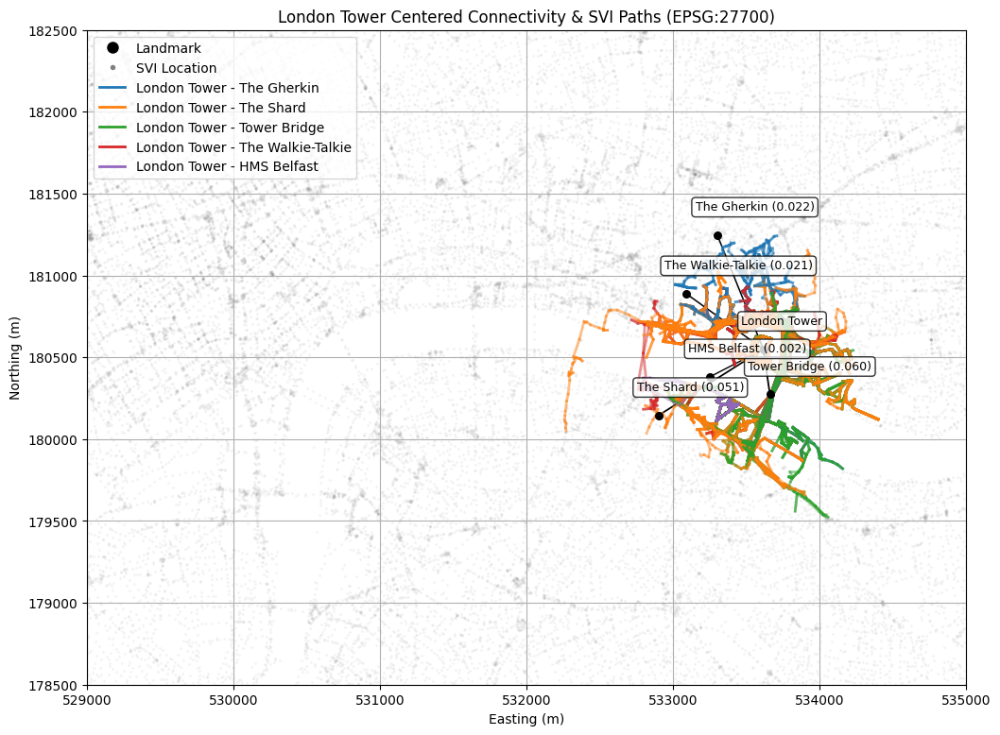

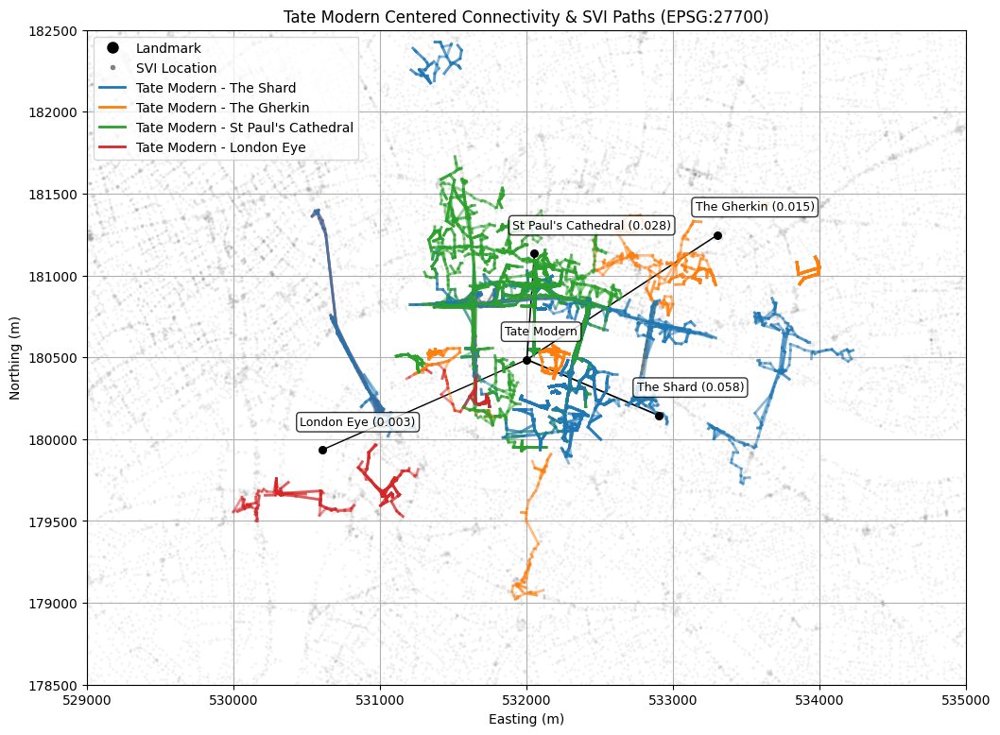

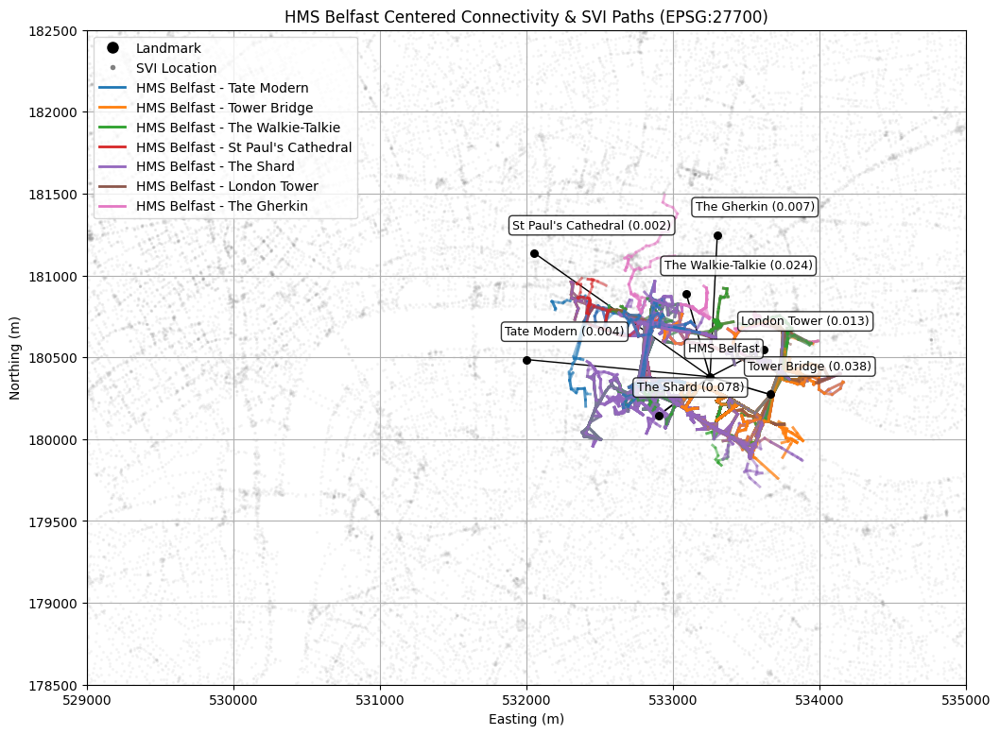

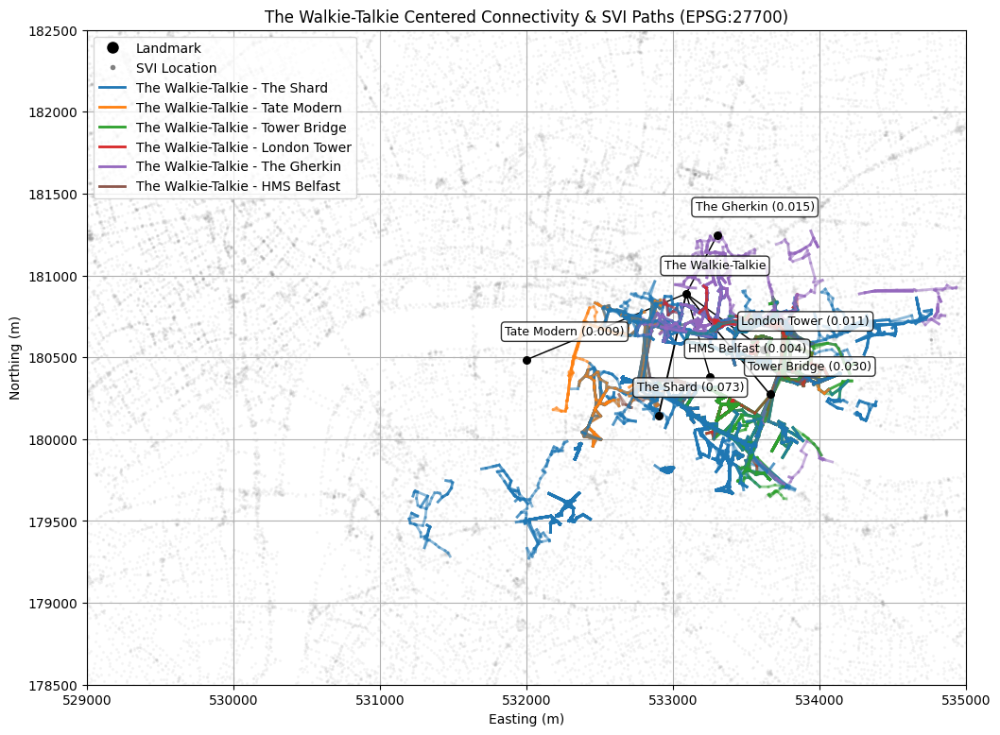

In [54]:
import random
from collections import Counter
from tqdm import tqdm
import torch
import matplotlib.pyplot as plt
from pyproj import Transformer
from matplotlib.lines import Line2D
# 为每个 landmark 绘制单独的图
n_landmark = hetero_graph.num_nodes("landmark")
for center in range(n_landmark):
    visualize_center_landmark(hetero_graph, center, connectivity_result, path_dict_detail,
                                node_scale=20, svi_linewidth=2, agg_line_alpha=1)

In [11]:
import geopandas as gpd
from shapely.geometry import Point, LineString
import pandas as pd
import os
from pyproj import Transformer

def export_svi_only_paths_to_geopackage(hetero_graph, paths_dict, output_file='svi_only_paths.gpkg',
                                       landmark_labels=None):
    """
    将随机游走路径导出为GeoPackage格式，但移除路径中的起点和终点Landmark节点
    只保留SVI节点形成的路径
    
    参数:
        - hetero_graph: 异质图对象
        - paths_dict: 随机游走生成的路径字典 {起始landmark: [路径1, 路径2, ...]}
        - output_file: 输出的GeoPackage文件路径
        - landmark_labels: landmark节点的标签列表（用于元数据）
    """
    # 创建坐标转换器：从WGS84(EPSG:4326)到英国国家网格(EPSG:27700)
    transformer = Transformer.from_crs("epsg:4326", "epsg:27700", always_xy=True)
    
    # 获取节点坐标
    # SVI节点坐标（已经是EPSG:27700）
    svi_x = hetero_graph.nodes["svi_location"].data["longitude"].cpu().numpy()
    svi_y = hetero_graph.nodes["svi_location"].data["latitude"].cpu().numpy()
    
    # Landmark节点坐标（需要从EPSG:4326转换为EPSG:27700）- 仅用于元数据
    lm_lat = hetero_graph.nodes["landmark"].data["latitude"].cpu().numpy()
    lm_lon = hetero_graph.nodes["landmark"].data["longitude"].cpu().numpy()
    lm_x, lm_y = transformer.transform(lm_lon, lm_lat)
    
    # 如果没有提供landmark标签，使用数字作为标签
    if landmark_labels is None:
        landmark_labels = [str(i) for i in range(len(lm_x))]
    else:
        # 确保标签数量足够
        landmark_labels = landmark_labels + [str(i) for i in range(len(landmark_labels), len(lm_x))]
    
    # 创建数据容器
    nodes_data = []
    paths_data = []
    
    # 添加SVI节点 (EPSG:27700)
    for i in range(len(svi_x)):
        nodes_data.append({
            'node_id': i,
            'node_type': 'svi_location',
            'label': f'svi_{i}',
            'geometry': Point(svi_x[i], svi_y[i])
        })
    
    # 处理路径
    path_id = 0
    for start_lm, paths in paths_dict.items():
        start_lm_label = landmark_labels[start_lm]
        
        for path in paths:
            # 提取路径中的SVI节点（移除起点和终点Landmark节点）
            svi_nodes = []
            
            for node in path:
                if node[0] == "svi_location":
                    svi_nodes.append(node)
            
            # 如果路径中至少有两个SVI节点，则创建LineString
            if len(svi_nodes) >= 2:
                coords = []
                node_sequence = []
                
                for node in svi_nodes:
                    node_id = node[1]
                    coords.append((svi_x[node_id], svi_y[node_id]))
                    node_sequence.append(f'svi_{node_id}')
                
                # 创建LineString几何体
                line = LineString(coords)
                
                # 提取原始路径的起点和终点Landmark（用于元数据）
                original_start = path[0][1] if path[0][0] == "landmark" else None
                original_end = path[-1][1] if path[-1][0] == "landmark" else None
                
                # 创建路径数据项
                paths_data.append({
                    'path_id': path_id,
                    'original_start_landmark': landmark_labels[original_start] if original_start is not None else None,
                    'original_end_landmark': landmark_labels[original_end] if original_end is not None else None,
                    'path_length': len(svi_nodes),
                    'node_sequence': '->'.join(node_sequence),
                    'geometry': line
                })
                path_id += 1
    
    # 创建GeoDataFrames (所有均为EPSG:27700坐标系)
    nodes_gdf = gpd.GeoDataFrame(nodes_data, crs="EPSG:27700")
    paths_gdf = gpd.GeoDataFrame(paths_data, crs="EPSG:27700")
    
    # 导出到GeoPackage
    if os.path.exists(output_file):
        os.remove(output_file)
    
    nodes_gdf.to_file(output_file, layer='nodes', driver='GPKG')
    paths_gdf.to_file(output_file, layer='paths', driver='GPKG')
    
    print(f"已将数据导出到 {output_file}，包含:")
    print(f"  - {len(nodes_gdf)} 个SVI节点 (layer: nodes)")
    print(f"  - {len(paths_gdf)} 条SVI-only路径 (layer: paths)")
    
    return nodes_gdf, paths_gdf

def visualize_svi_only_paths(nodes_gdf, paths_gdf, output_file=None):
    """
    可视化仅包含SVI节点的路径
    
    参数:
        - nodes_gdf: 包含SVI节点的GeoDataFrame
        - paths_gdf: 包含SVI路径的GeoDataFrame
        - output_file: 可选的输出文件路径，用于保存图像
    """
    import matplotlib.pyplot as plt
    import contextily as ctx
    from matplotlib.lines import Line2D
    
    fig, ax = plt.figure(figsize=(16, 12))
    
    # 绘制SVI节点
    nodes_gdf.plot(ax=ax, color='gray', markersize=5, alpha=0.5, zorder=2, label='SVI Location')
    
    # 绘制路径，根据路径长度设置颜色（热度图）
    paths_gdf['color_value'] = paths_gdf['path_length'].apply(lambda x: min(x/10, 1))  # 归一化路径长度
    
    # 使用冷色到暖色的渐变
    cmap = plt.cm.viridis
    
    for idx, row in paths_gdf.iterrows():
        color = cmap(row['color_value'])
        if row['geometry'] is not None and not row['geometry'].is_empty:
            x, y = row['geometry'].xy
            ax.plot(x, y, color=color, linewidth=1.5, alpha=0.7, zorder=1)
    
    # 添加背景地图
    try:
        ctx.add_basemap(ax, crs=nodes_gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron)
    except Exception as e:
        print(f"无法添加背景地图: {e}")
    
    # 添加图例
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=5, label='SVI节点'),
        Line2D([0], [0], color=cmap(0.2), lw=2, label='短路径'),
        Line2D([0], [0], color=cmap(0.5), lw=2, label='中等路径'),
        Line2D([0], [0], color=cmap(0.8), lw=2, label='长路径')
    ]
    ax.legend(handles=legend_elements, loc='upper right')
    
    # 添加标题和轴标签
    plt.title('随机游走生成的SVI路径可视化')
    plt.xlabel('Easting (m)')
    plt.ylabel('Northing (m)')
    
    # 自动调整布局
    plt.tight_layout()
    
    # 保存图像（如果提供了输出路径）
    if output_file:
        plt.savefig(output_file, dpi=300, bbox_inches='tight')
        print(f"可视化结果已保存到 {output_file}")
    
    plt.show()
    
    return fig, ax

# 使用示例
def export_and_visualize(hetero_graph, paths_dict, landmark_labels=None):
    """
    导出SVI路径并可视化，方便调用
    """
    # 导出数据
    output_file = 'svi_only_paths.gpkg'
    nodes_gdf, paths_gdf = export_svi_only_paths_to_geopackage(
        hetero_graph, 
        paths_dict, 
        output_file=output_file,
        landmark_labels=landmark_labels
    )
    
  
    return nodes_gdf, paths_gdf

In [12]:
# 定义landmark标签
landmark_labels = ["big_ben", "gherkin", "london_eye", 'st_paul', 'tower_bridge', 'the_shard',
                   'london_tower', 'tate_modern', 'belfast', 'walkie_talkie']

# 导出仅包含SVI节点的路径并可视化
nodes_gdf, paths_gdf = export_and_visualize(hetero_graph, paths_dict, landmark_labels)

已将数据导出到 svi_only_paths.gpkg，包含:
  - 35462 个SVI节点 (layer: nodes)
  - 2031 条SVI-only路径 (layer: paths)


<Axes: >

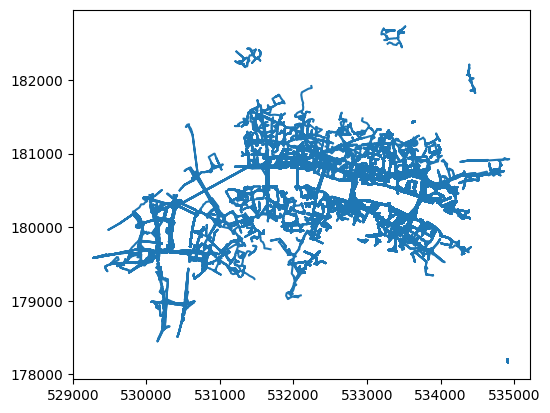

In [13]:
paths_gdf.plot()

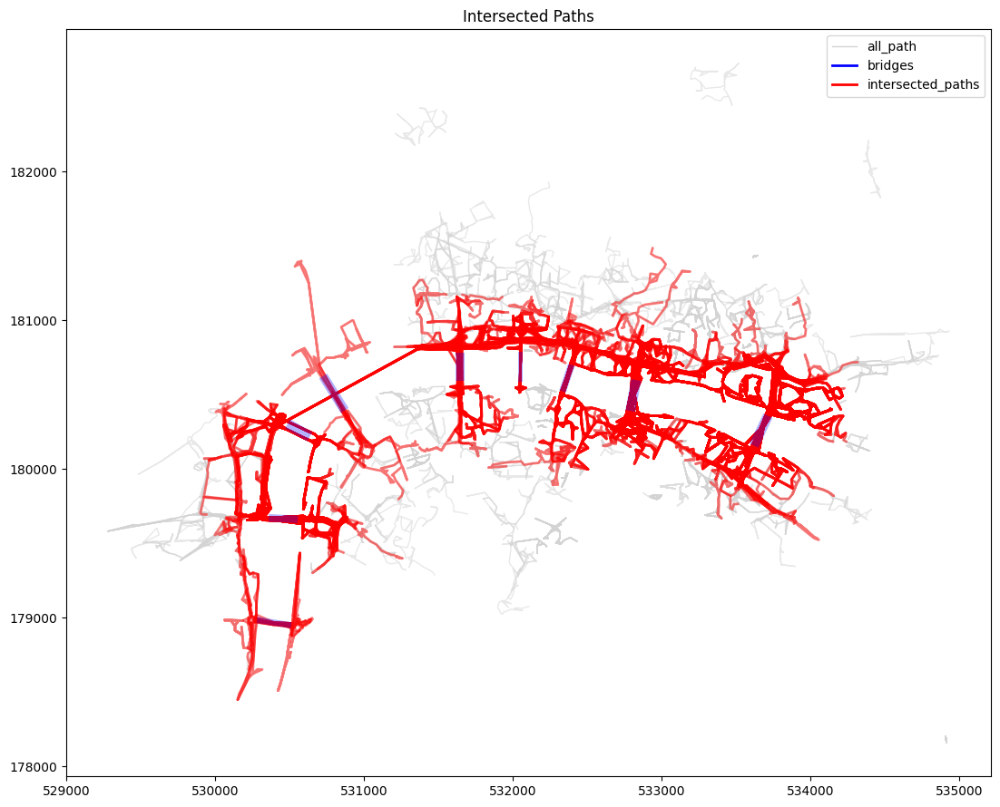

In [25]:
import numpy as np
from pyproj import Transformer
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.colors as colors
import matplotlib.cm as cm

bridges_gdf = gpd.read_file('bridges_london.gpkg')
# 查找与桥梁相交的路径
# 首先确保两个GeoDataFrame使用相同的坐标参考系统
if paths_gdf.crs != bridges_gdf.crs:
    bridges_gdf = bridges_gdf.to_crs(paths_gdf.crs)

# 使用空间连接找出与桥梁相交的路径
intersecting_paths = gpd.sjoin(paths_gdf, bridges_gdf, how="inner", predicate="intersects")


# 可视化相交的路径和桥梁
fig, ax = plt.subplots(figsize=(12, 9))

# 绘制所有路径（半透明）
paths_gdf.plot(ax=ax, color='lightgrey', alpha=0.5, linewidth=1)


# 高亮显示与桥梁相交的路径
if not intersecting_paths.empty:
    intersecting_paths.plot(ax=ax, color='red', alpha = 0.5,linewidth=2)

# 绘制桥梁
bridges_gdf.plot(ax=ax, color='blue', alpha=0.3, linewidth=0, zorder = 2)

# 添加标题和图例
ax.set_title('Intersected Paths')
custom_lines = [
    Line2D([0], [0], color='lightgrey', lw=1),
    Line2D([0], [0], color='blue', lw=2),
    Line2D([0], [0], color='red', lw=2)
]
ax.legend(custom_lines, ['all_path', 'bridges', 'intersected_paths'], loc='upper right')

plt.tight_layout()
plt.show()


In [28]:
# 计算每座桥梁相交的路径数量
bridge_path_counts = intersecting_paths.groupby('name').size().reset_index(name='path_count')

# 计算相交桥梁的总路径数量
total_intersecting_paths = bridge_path_counts['path_count'].sum()

# 计算总路径数量
total_paths = len(paths_gdf)

# 计算每座桥梁相交路径占总路径的比例
bridge_path_counts['percentage'] = bridge_path_counts['path_count'] / total_paths * 100

# 添加总计行
total_row = pd.DataFrame({
    'name': ['总计'],
    'path_count': [total_intersecting_paths],
    'percentage': [total_intersecting_paths / total_paths * 100]
})

# 合并总计行
bridge_path_counts = pd.concat([bridge_path_counts, total_row], ignore_index=True)

# 格式化百分比列
bridge_path_counts['percentage'] = bridge_path_counts['percentage'].apply(lambda x: f"{x:.2f}%")

# 显示结果表格
print("桥梁与路径相交统计:")
print(f"总路径数量: {total_paths}")
print(f"与桥梁相交的不同路径数量: {len(intersecting_paths['path_id'].unique())}")
bridge_path_counts

桥梁与路径相交统计:
总路径数量: 2031
与桥梁相交的不同路径数量: 578


,name,path_count,percentage
0,Blackfriars Bridge,35,1.72%
1,Hungerford Bridge and Golden Jubilee Bridges,21,1.03%
2,Lambeth Bridge,9,0.44%
3,London Bridge,136,6.70%
4,Millennium Bridge,25,1.23%
5,Southwark Bridge,46,2.26%
6,Tower Bridge,243,11.96%
7,Waterloo Bridge,13,0.64%
8,Westminster Bridge,62,3.05%
9,总计,590,29.05%
